In [1]:
"""Ниже представлен график динамики продаж видеоигр в зависимости от региона. По оси ординат отложено число
проданных дисков с видеоиграми (в миллионах) в различных регионах (NA — Северная Америка, EU — Европа, 
JP — Япония, Other — другие регионы, Global — во всём мире), по оси абсцисс — год выпуска игры."""

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

vg_data = pd.read_csv('data/vgsales.csv')
dinamic_by_region = vg_data[
        ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales', 'Year_of_Release']
    ].groupby('Year_of_Release').sum()

fig = plt.figure(figsize=(12, 6))
lineplot = sns.lineplot(data=dinamic_by_region)
lineplot.set_title('Динамика продаж видеоигр', fontsize=16)
lineplot.set_xlabel('Год выпуска')
lineplot.set_ylabel('Суммарный объём продаж')

"""Ниже приведено два вида гистограмм с общей осью.
Верхняя гистограмма описывает общее распределение стоимости недвижимости в Мельбурне. Весь диапазон цен разбит
на 30 равных интервалов. На каждом интервале строится прямоугольник, его высота — число объектов, стоимость
которых лежит в этом интервале.
Нижняя гистограмма описывает то же распределение,но с учётом типов недвижимости.Здесь число объектов,попавших в
корзину,обозначается интенсивностью цвета:чем темнее полоса,тем больше в данных объектов с ценой из этого интервала."""

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

melb_data = pd.read_csv('data_test/melb_data.csv')

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))
plt.subplots_adjust(hspace=.0)

histplot1 = sns.histplot(
    data=melb_data, 
    x='Price', 
    bins=30,
    ax=axes[0],
)
histplot1.set_title('Распределение стоимости недвижимости в Мельбурне', fontsize=16)
histplot1.set_xlabel('Цена объекта (млн. австралийских долларов)')
histplot1.set_ylabel('Число объектов')

histplot2 = sns.histplot(
    data=melb_data,
    x='Price',
    y='Type',
    bins=30,
    color='green',
    ax=axes[1]
)
histplot2.set_xlabel('Цена объекта (млн. австралийских долларов)')
histplot2.set_ylabel('Тип объекта')

"""Окунёмся немного в орнитологию. На диаграмме рассеяния ниже показана зависимость длины крыльев пингвинов от
длины их клюва в миллиметрах. При этом цвет точки на графике зависит от вида пингвина, а размер точки — от пола
птицы. Итого на одном графике уместилась зависимость сразу между четырьмя признаками! И это ещё не предел."""

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

penguins_df = sns.load_dataset("penguins")

fig = plt.figure(figsize=(10, 5))

scatterplot = sns.scatterplot(
    data=penguins_df,
    x='bill_length_mm',
    y='flipper_length_mm',
    hue='species',
    s=100,
    size='sex',
    sizes=(50, 300)

)
scatterplot.set_title('Взаимосвязь размеров параметров тела разных видов пингвинов', fontsize=16)
scatterplot.set_xlabel('Длина клюва')
scatterplot.set_ylabel('Длина крыльев')

"""Перед вами диаграмма количества погибших главных и второстепенных персонажей в сериале «Игра престолов» в
зависимости от их верности какому-либо из домов. На диаграмме изображены названия семи домов (None — персонаж не
принадлежал к определённому дому), а внутри секторов указано количество погибших персонажей в процентах."""
import matplotlib.pyplot as plt
import pandas as pd

game_of_thrones_df = pd.read_csv('data/character-deaths.csv')
game_of_thrones_df['Allegiances'] = game_of_thrones_df['Allegiances'].str.replace('House ', '')
fig = plt.figure(figsize=(12, 6))
ax = fig.add_axes((1, 1, 1, 1))
deaths_count = game_of_thrones_df['Allegiances'].value_counts().sort_values(ascending=False).head(7)
pie = ax.pie(
    deaths_count,
    labels=deaths_count.index,
    autopct='%1.1f%%',
    startangle=90
)
title = ax.set_title('Смертность персонажей в GoT в зависимости от их верности', fontsize=16)
plt.show(pie)

"""В качестве примера приведём две диаграммы стоимости женского нижнего белья на сайте Amazon.

На левой диаграмме изображены средние цены товаров для каждого бренда. На правой диаграмме изображены те же цены,
но с разделением цветом по категориям товаров (Bras — бюстгальтеры, Panties — трусы). Правая диаграмма является
многоуровневой столбчатой диаграммой."""

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

amazon_data = pd.read_csv('data/amazon_com.csv')

def replace_url(brand_name):
    if 'ref=' in brand_name:
        if 'Calvin' in brand_name:
            return 'Calvin-Klein'
        elif 'Wacoal' in brand_name:
            return 'Wacoal'
        else:
            return 'b.tempt'
    else:
        return brand_name
    
amazon_data['brand_name'] = amazon_data['brand_name'].apply(replace_url)
amazon_data['price'] = amazon_data['price'].str.replace('$', '').astype('float64')
amazon_data['brand_name'].unique()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))
barplot1 = sns.barplot(
    data=amazon_data,
    x='brand_name',
    y='price',
    orient='v',
    ax = axes[0],
    ci=None
)
barplot1.tick_params(axis='x', rotation=70);
barplot1.set_title('Средняя стоимость товаров по брендам', fontsize=16);
barplot1.set_xlabel('Название бренда', fontsize=14);
barplot1.set_ylabel('Средняя цена', fontsize=14);
barplot1.grid()

barplot2 = sns.barplot(
    data=amazon_data,
    x='brand_name',
    y='price',
    hue='product_category',
    orient='v',
    ax = axes[1],
    ci=None,
    dodge=False
)
barplot2.tick_params(axis='x', rotation=70);
barplot2.set_title('Средняя стоимость товаров по брендам и категориям', fontsize=16);
barplot2.set_xlabel('Название бренда', fontsize=14);
barplot2.set_ylabel('Средняя цена', fontsize=14);
barplot2.grid()

"""Ниже представлена тепловая карта ежедневной активности в Twitter Дональда Трампа и Джо Байдена перед
американскими президентскими выборами в 2020 году.
На оси абсцисс отложены минуты, а на оси ординат — часы. Квадраты тепловых карт окрашены в соответствии с тем,
сколько твитов было выложено кандидатами в каждую часовую/минутную ячейку за указанный период. Сбоку находится
легенда, которая показывает соотношения цвета и количества твитов."""
tweets_df = pd.read_csv("https://bit.ly/3cngqgL", 
                 parse_dates=['date_utc'], 
                 dtype={'hour_utc':int,'minute_utc':int,'id':str}
                )
g = tweets_df.groupby(['hour_utc','minute_utc','username'])
tweet_cnt = g.id.nunique()
jb_tweet_cnt = tweet_cnt.loc[:,:,'JoeBiden'].reset_index().pivot_table(index='hour_utc', columns='minute_utc', values='id', fill_value=0)
dt_tweet_cnt = tweet_cnt.loc[:,:,'realDonaldTrump'].reset_index().pivot_table(index='hour_utc', columns='minute_utc', values='id', fill_value=0)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 12))
jb_heatmap = sns.heatmap(
    jb_tweet_cnt,
    linewidth=1,
    linecolor='w',
    cmap='viridis',
    ax = axes[0]
)
jb_heatmap.set_title('@JoeBiden');
jb_heatmap.set_xlabel('Минута часа');
jb_heatmap.set_ylabel('Час дня');

dt_heatmap = sns.heatmap(
    dt_tweet_cnt,
    linewidth=1,
    linecolor='w',
    cmap='viridis',
    ax = axes[1]
)

dt_heatmap.set_title('@realDonaldTrump');
dt_heatmap.set_xlabel('Минута часа');
dt_heatmap.set_ylabel('Час дня');

"""Коробчатая диаграмма ниже иллюстрирует зависимость возраста пользователей компании CitiBike от типа пользователя
(Customer — клиент с подпиской на 24 часа или на три дня, Subscriber — подписчик с годовой арендой велосипеда)."""
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

citibike_df = pd.read_csv('data/citibike-tripdata.csv')
citibike_df['age'] = 2018 - citibike_df['birth year']

fig = plt.figure(figsize=(12, 6))
boxplot = sns.boxplot(data=citibike_df, x='age', y='usertype')
boxplot.set_title('Boxplot для возраста пользователей приложения CitiBike', fontsize=16)
boxplot.set_xlabel('Возраст пользователя')
boxplot.set_ylabel('Тип пользователя')



FileNotFoundError: [Errno 2] No such file or directory: 'data/vgsales.csv'

In [ ]:
import pandas as pd
covid_data = pd.read_csv('data_test/covid_data.csv')

vaccinations_data = pd.read_csv('data_test/country_vaccinations.csv')
vaccinations_data = vaccinations_data[
    ['country', 'date', 'total_vaccinations', 
     'people_vaccinated', 'people_vaccinated_per_hundred',
     'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred',
     'daily_vaccinations', 'vaccines']
]
covid_data = covid_data.groupby(
    ['date','country'],
    as_index=False
    )[['confirmed','deaths','recovered']].sum()
covid_data['date'] = pd.to_datetime(covid_data['date'])
covid_data['active'] = (covid_data['confirmed'] - covid_data['deaths'] - covid_data['recovered']).astype(int)
covid_data = covid_data.sort_values(by=['country', 'date'])
covid_data['daily_confirmed'] = covid_data.groupby('country')['confirmed'].diff()
covid_data['daily_confirmed']


11337    NaN
11570    0.0
11807    0.0
12051    0.0
12299    0.0
        ... 
15933    0.0
16595    0.0
16938    0.0
17290    0.0
17645    0.0
Name: daily_confirmed, Length: 86785, dtype: float64

In [1]:
import pandas as pd
covid_data = pd.read_csv('data_test/covid_data.csv')
covid_data
"""Мы будем работать со следующими столбцами:
date — дата наблюдения;
province/state — наименование провинции/штата;
country — наименование страны;
confirmed — общее число зафиксированных случаев на указанный день;
deaths — общее число зафиксированных смертей на указанный день;
recovered — общее число выздоровлений на указанный день."""

vaccinations_data = pd.read_csv('data_test/country_vaccinations.csv')
vaccinations_data = vaccinations_data[
    ['country', 'date', 'total_vaccinations', 
     'people_vaccinated', 'people_vaccinated_per_hundred',
     'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred',
     'daily_vaccinations', 'vaccines']
]
vaccinations_data
"""Данная таблица содержит следующие столбцы:

country — наименование страны;
date — дата наблюдения;
total_vaccinations — общее число введённых вакцин в стране на указанный день;
people_vaccinated — общее число привитых первым компонентом в стране на указанный день;
people_vaccinated_per_hundred — процент привитых первым компонентом в стране на указанный день
(рассчитывается как: people_vaccinated / population * 100);
people_fully_vaccinated — общее число привитых вторым компонентом в стране на указанный день 
(первый компонент уже был введён им ранее);
people_fully_vaccinated_per_hundred — процент привитых вторым компонентом в стране на указанный день
(рассчитывается как: people_fully_vaccinated / population * 100 );
daily_vaccination — ежедневная вакцинация (число вакцинированных в указанный день);
vaccines — комбинации вакцин, используемые в стране."""

#В таблице covid_data:
#Группируем таблицу по дате и названию страны и рассчитываем суммарные показатели по всем регионам. 
#Тем самым переходим от данных по регионам к данным по странам:"""
covid_data.groupby(
    ['date','country'],
    as_index=False
)[['confirmed','deaths','recovered']].sum()
#Преобразуем даты в формат datetime с помощью функции pd.to_datetime():
covid_data['date'] = pd.to_datetime(covid_data['date'])
#Создадим признак больных на данный момент (active). Для этого вычтем из общего числа зафиксированных случаев
#число смертей и число выздоровевших пациентов:
covid_data['active'] = covid_data['confirmed'] - covid_data['deaths'] - covid_data['recovered']
covid_data['active']
#Создадим признак ежедневного прироста числа заболевших, умерших и выздоровевших людей. Для этого отсортируем
#данные по названиям стран, а затем по датам. После этого произведём группировку по странам и рассчитаем разницу
#между «вчера и сегодня» с помощью метода diff():
covid_data = covid_data.sort_values(by=['country','date'])
covid_data['daily_confirmed'] = covid_data.groupby('country')['confirmed'].diff()
covid_data['daily_deaths'] = covid_data.groupby('country')['deaths'].diff()
covid_data['daily_recovered'] = covid_data.groupby('country')['recovered'].diff()
covid_data
#В таблице vaccinations_data достаточно будет преобразовать столбцы в формат datetime:
vaccinations_data['date'] = pd.to_datetime(vaccinations_data['date'])
#За какой период представлены данные в таблице covid_data?
covid_data['date'].min()
covid_data['date'].max()
print(f"Данные о заболеваемости предоставлены от {covid_data['date'].min()} до  {covid_data['date'].max()}")
#За какой период представлены данные в таблице vaccinations_data? В качестве ответа введите даты в формате
#datetime без указания времени.
vaccinations_data['date'].sort_values()
print(f"Данные о вакцинации предоставлены от {vaccinations_data['date'].min()} до  {vaccinations_data['date'].max()}")
#С помощью метода merge() объедините таблицы covid_data и vaccinations_data по столбцам date и country.
#Тип объединения выставьте так, чтобы в результирующую таблицу попали только наблюдения за период, вычисленный
#в задании 3.1. То есть в результирующую таблицу должны попасть все записи из таблицы covid_data и из её
#пересечения с vaccinations_data, но не более. Результат объединения занесите в переменную covid_df.
#Сохраните таблицу covid_df — она понадобится нам в следующем юните.
#Сколько строк и столбцов в таблице covid_df?
covid_df = covid_data.merge(
    vaccinations_data,
    on=['date','country'],
    how='left'
)
print('Number of rows:',covid_df.shape[0])
print('Number of columns:',covid_df.shape[1])
covid_df
"""В получившейся в задании 3.3 таблице covid_df создайте признаки death_rate — общий процент смертей среди
зафиксированных случаев (летальность) и recover_rate — общий процент случаев выздоровления. Данные
характеристики рассчитайте как отношение числа смертей (deaths) и числа выздоровлений (recovered) к
числу зафиксированных случаев (confirmed) и умножьте результаты на 100%."""
#Какова максимальная летальность в США (United States) за весь период? Ответ округлите до второго знака
#после запятой.
covid_df['death_rate'] = covid_df['deaths'] / covid_df['confirmed'] * 100
covid_df['recover_rate'] = covid_df['recovered'] / covid_df['confirmed'] * 100
maxik = covid_df [covid_df['country'] == 'United States']['death_rate'].max()
covid_df[(covid_df['death_rate'] == maxik) & (covid_df['country'] == 'United States')]
covid_df[covid_df['country'] == 'United States']['death_rate']
#covid_df[maxik]
#Чему равен средний процент выздоровевших в России (Russia)? Ответ округлите до второго знака после запятой.
round (covid_df[covid_df['country'] == 'Russia']['recover_rate'].mean(), 2)
covid_df.head()


Данные о заболеваемости предоставлены от 2020-01-22 00:00:00 до  2021-05-29 00:00:00
Данные о вакцинации предоставлены от 2020-12-02 00:00:00 до  2021-09-06 00:00:00
Number of rows: 306429
Number of columns: 17


,date,province/state,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate
0,2020-02-24,NaN,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,2020-02-25,NaN,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,2020-02-26,NaN,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,2020-02-27,NaN,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,2020-02-28,NaN,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0


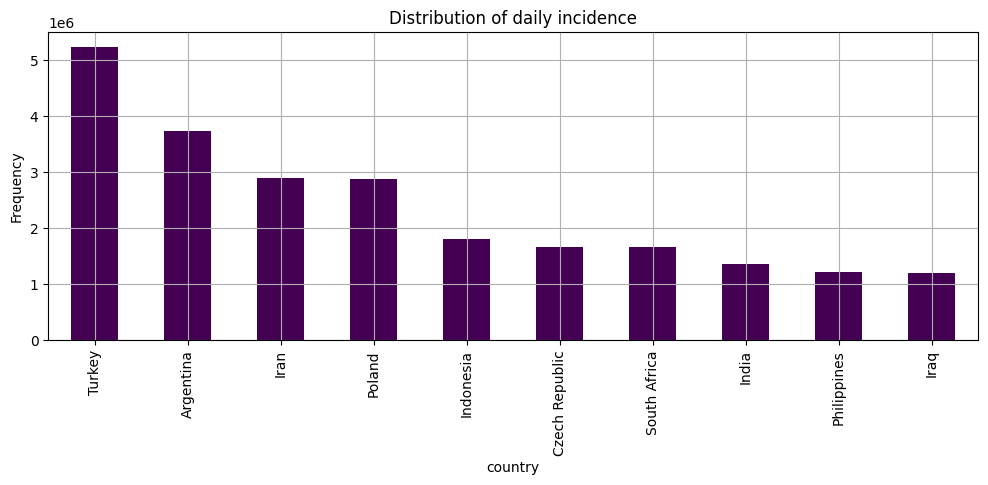

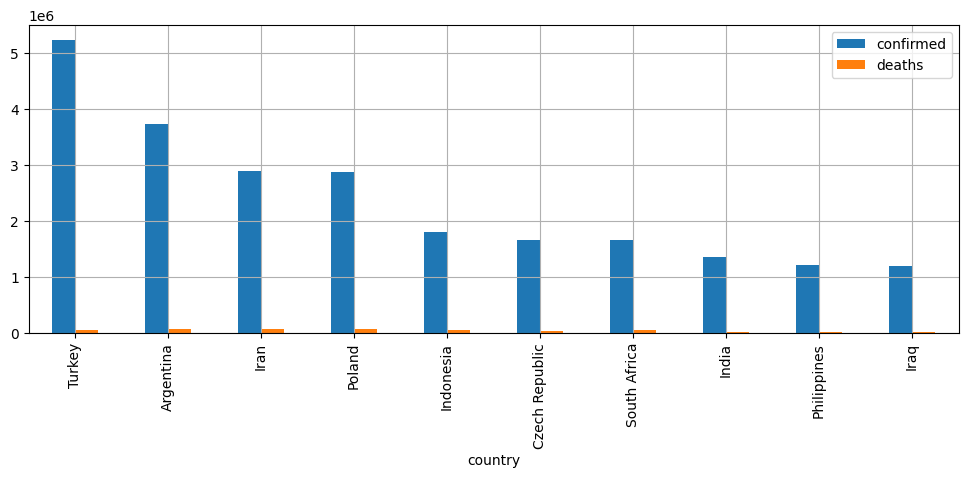

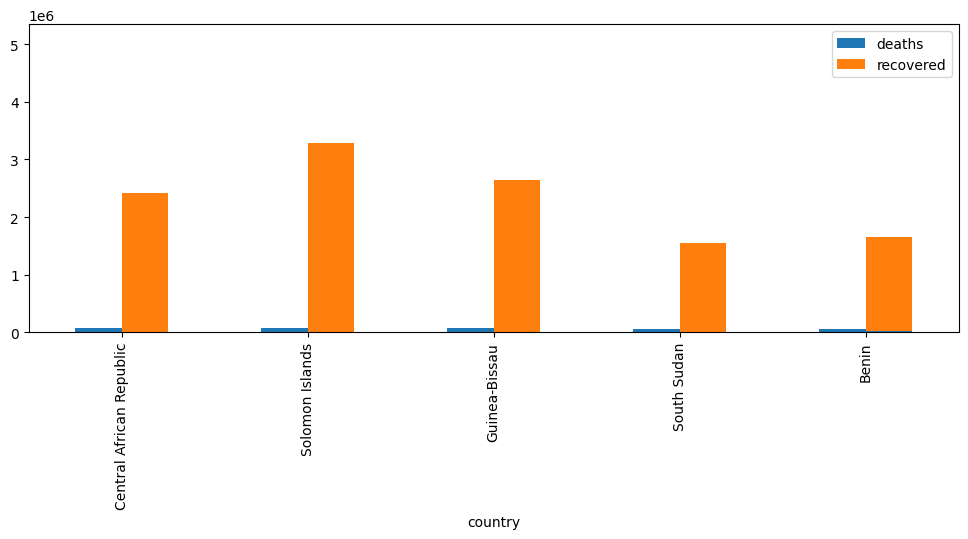

In [5]:
"""Основные параметры метода plot()
x — название признака, который будет отложен по оси абсцисс;
y — название признака, который будет отложен по оси ординат;
figsize — размер графика (кортеж из ширины и высоты в дюймах);
kind —тип визуализации. Основные типы:
'line' — линейный график (по умолчанию);
'bar' — столбчатая диаграмма;
'barh' — горизонтальная столбчатая диаграмма;
'hist' — гистограмма;
'box' — коробчатая диаграмма (boxplot);
'pie' — круговая диаграмма;
'scatter' — диаграмма рассеяния.
grid — отображение сетки (по умолчанию False);
legend — отображение легенды (по умолчанию False);
title — название графика;
color — цвет.
Начнём с исследования заболеваемости коронавирусом во всём мире. Для этого первым делом отобразим, как менялось
ежедневное число заболевших (daily_confirmed) во всём мире во времени. Далее сгруппируем таблицу по датам и
подсчитаем суммарное число зафиксированных случаев по дням.
Теперь мы наконец можем построить график с помощью метода plot(). Будем использовать линейный график размером
12x4 (попробуйте взять другие числа, чтобы увидеть разницу). Подпишем график и отобразим сетку. Параметр
lw (line width) отвечает за ширину линии для линейного графика."""
grouped_cases = covid_df.groupby('date')['daily_confirmed'].sum()
"""grouped_cases.plot(
    kind='line',
    figsize=(20,10),
    title="Daily incidence over time",
    grid = True,
    lw=2
);"""
"""Теперь построим гистограмму, которая покажет распределение ежедневной заболеваемости во всём мире. Для этого
параметр kind выставляем на значение 'hist'. Параметр bins (корзины) отвечает за число прямоугольников в
гистограмме — пусть их будет 10 (попробуйте использовать другие числа, чтобы увидеть разницу)."""
grouped_cases.plot(
    kind='hist',
    figsize=(10,6),
    title='Distribution of daily incidence',
    grid= True,
    color = 'black',
    bins=30
);

"""Давайте построим столбчатую диаграмму, которая покажет ТОП-10 стран по суммарной заболеваемости.
Для этого сгруппируем данные по странам и вычислим последний зафиксированный показатель с помощью агрегирующего
метода last() — он возвращает последнее значение в столбце DataFrame.
Для построения столбчатой диаграммы значение параметра kind выставляем на 'bar'. Параметр colormap отвечает за
цветовую гамму графика."""
grouped_country = covid_df.groupby(['country'])['confirmed'].last()
grouped_country = grouped_country.nlargest(10)
grouped_country.plot(
    kind='bar',
    grid= True,
    figsize=(12,4),
    colormap='viridis'
);
#А теперь посмотрим, как в этих десяти странах соотносится количество заболевших и умерших от вируса.
#Для этого отобразим сразу два показателя на столбчатой диаграмме: 
grouped_country = covid_df.groupby(['country'])[['confirmed','deaths']].last()
grouped_country = grouped_country.nlargest(10, columns=['confirmed'])
grouped_country.plot(
    kind='bar',
    grid=True,
    figsize=(12,4)
);
"""Очевидно, что отношение числа умерших к числу заболевших весьма низкое. Также это может косвенно говорить о
разных методиках учёта заболевших (например, какие-то страны могут учитывать заболевших только по мазку, в то
время как другие — по клинической картине, учитывающей и другие показатели). То есть с методической точки зрения
учёт по числу заражений может быть не совсем корректным. Лучшим показателем будет являться число смертей (хотя
и этот метод не идеален).
Более того, если построить график с сортировкой не по числу заболевших, а по числу умерших, поменяются и места,
и страны в рейтинге. Попробуйте построить такой график сами!"""
grouped_country = covid_df.groupby(['country'])[['deaths','recovered']].last()
grouped_country = grouped_country.nlargest(10, columns=['deaths'])
grouped_country.plot(
    kind='bar',
    grid= True,
    figsize=(12,4)
);
#grouped_cases = covid_df.groupby('date')['daily_deaths'].sum()
#grouped_cases.plot(kind='line',xlabel='Дата', ylabel='Число смертей в мире');

#С помощью какого из перечисленных ниже вариантов кода можно построить столбчатую диаграмму для пяти стран с
#наименьшим общим числом вакцинаций на последний день рассматриваемого периода (total_vaccinations)?
covid_df.groupby(['country'])['total_vaccinations'].last().nsmallest(5).plot(kind='bar');



NameError: name 'covid_df' is not defined

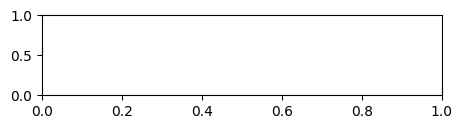

In [2]:
"""За визуализацию графиков в Matplotlib отвечает модуль pyplot. Традиционно он импортируется под
псевдонимом plt. Для более корректного отображения графиков в ноутбуках используется команда %matplotlib inline."""
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
#Если вы используете тёмную тему в VS Code, то для корректного отображения графиков на тёмном фоне выполните
#следующую команду по установке стиля отображения:
plt.style.use('default')
"""Процесс работы над графиком максимально прозрачен: сначала создаётся объект фигуры (fig) , содержащий
необходимую информацию и настройки, например размер в дюймах (figsize, восемь дюймов в ширину, четыре —
в высоту). К этому объекту с помощью метода add_axes() добавляется координатная плоскость, а на ней располагаются
графические объекты. Для создания координатной плоскости необходимо указать её расположение на фигуре в виде
списка из координат. В нашем случае она начинается в левом нижнем углу без отступов (координаты 0, 0) и занимает
всё отведённое место в области (100%, ширина и высота равны 1)."""

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([3, 5, 0.5, 0.2])

#построим диаграмму рассеяния, которая покажет зависимость числа ежедневно обнаруживаемых случаев заражения
#(daily_confirmed) от общего количества привитых вторым компонентом вакцины (people_fully_vaccinated) в США.
#У объекта координатной плоскости axes вызовем метод scatter().
"""x, y — последовательности, которые будут отложены по осям абсцисс и ординат;
s — размер маркеров;
marker — вид маркеров ('o' — точки, '^' — треугольники);
c — цвет маркеров."""

#На диаграмме по абсцисс откладываем суммарное число поставленных вакцин,а по ординат—ежедневный прирост заболевших:
us_data = covid_df[covid_data['country'] == 'United States']

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=us_data['people_fully_vaccinated'], 
    y=us_data['daily_confirmed'], 
    s=50,
    marker='o',
    c = 'blue'
);

"""Для построения круговых диаграмм в Matplotlib используется метод pie().
x — значения, по которым будет строиться круговая диаграмма;
labels — метки, соответствующие значениям;
autopct — формат отображения долей на диаграмме (например, '%.1f%%' означает, что округление будет производиться
до первого знака после запятой и при выводе будет указан знак "%"; открывающий и закрывающий проценты означают
форматирование, а внутренний — вывод знака "%");
explode — последовательность, которая определяет долю смещения сектора от центра для каждого значения из x.

ТОП-10 комбинаций вакцин (vaccines) по распространённости мы находим с помощью метода value_counts(). Круговую
диаграмму строим на полученных значениях, метки для каждого значения — индексы промежуточной таблицы. Будем 
отображать доли в процентах и округлять их до одного знака после запятой. Самую распространённую вакцину 
сместим на 10 % от центра:"""
vaccine_combinations = covid_df['vaccines'].value_counts()[:10]
fig = plt.figure(figsize=(5,5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccine_combinations,
    labels=vaccine_combinations.index,
    autopct='%.1f%%',
    explode=[0.1, 0, 0, 0, 0, 0,0,0,0,0]
);
"""Более правильным вариантом в данном случае было бы выделить каждую вакцину в отдельности и посчитать, в
скольких странах она используется:
1.Для начала нам необходимо избавиться от пропусков в столбце с вакцинами. Сделаем это с помощью метода dropna(),
который удаляет строки, содержащие пропуски в столбце, указанном в параметре subset(). Данный метод мы будем
изучать в следующем модуле, посвящённом очистке данных — пока что не вам не стоит заострять на нём внимание:"""
covid_df['vaccines']
combination_not_nan = covid_df.dropna(subset=['vaccines'])
combination_not_nan
#2.Полученные данные необходимо сгруппировать по странам (country) и определить последнюю зафиксированную
# комбинации вакцин в столбце vaccines:
combination_last = combination_not_nan.groupby(['country'])['vaccines'].last()
#В результате такого преобразования мы получаем Series, значениями которого являются комбинации вакцин, которые
#использовались в странах в последний день рассматриваемого периода.
combination_last
#3.Преобразуем данные с помощью метода apply(): применим к столбцу lambda-функцию, в которой будем удалять из
#строки с комбинациями вакцин пробелы и разделять комбинацию на отдельные составляющие по запятым.
combination_last = combination_last.apply(lambda x: x.replace(' ', '').split(','))
#В результате в каждой строке столбца получим список с отдельными вакцинами, которые используются в стране:
combination_last
"""4.Создадим словарь vaccines_dict={}, ключами которого будут являться уникальные вакцины, а значениями —
количество стран, в которых они используются. Изначально словарь пустой.
5.Заполнение словаря реализуем «в лоб» — используя циклы. Во внешнем цикле будем проходиться по всем элементам
Series combination_last. На каждой итерации цикла в переменной цикла vaccines_list будет находиться список
вакцин, которые используются в стране.
Во внутреннем цикле будем проходиться по элементам этого списка,вакцинам.Переменную внутреннего цикла назовём vaccine.
В теле внутреннего цикла проверяем условие, что текущей вакцины ещё нет среди ключей словаря vaccones_dict. Если
это условие выполняется, добавляем вакцину в словарь со значением 1. В противном случае увеличиваем текущее
количество стран, в которых используется данная вакцина:"""
vaccines_dict = {} 
#создаём цикл по элементам Series combination_last
for vaccines_list in combination_last:
    #создаём цикл по элементам списка с вакцинами
    for vaccine in vaccines_list:
        #проверяем условие, что текущей вакцины ещё нет среди ключей словаря
        if vaccine not in vaccines_dict:#если условие выполняется
            vaccines_dict[vaccine] = 1 #заносим вакцину в словарь со значением 1
        else: #в противном случае
            vaccines_dict[vaccine] += 1 #увеличивает количество
vaccines_dict
"""6.В результате работы получаем словарь, который преобразуем в объект Series. Далее выделим семь наиболее
популярных вакцин, а остальные обозначим как 'other'. Для этого сортируем Series по убыванию. Вычислим суммарное
количество стран, в которых используются вакцины, не попавшие в наш ТОП-7, результат запишем в Series по
индексу 'other'.
Далее выделим восемь наибольших значений в полученной Series — для них и будем строить круговую диаграмму."""
vaccines = pd.Series(vaccines_dict).sort_values(ascending=False)
vaccines['other'] = vaccines[7:].sum()
vaccines = vaccines.sort_values(ascending=False)[:8]
#7.Строим круговую диаграмму:
fig = plt.figure(figsize=(5,5))
axes = fig.add_axes([0,0,1,1])
axes.pie(
    vaccines,
    labels=vaccines.index,
    autopct='%.1f%%',
);
"""#Полный код:
#избавляемся от пропусков в столбце с вакцинами
combination_not_nan = covid_data.dropna(subset=['vaccines'])
#группируем по странам и выбираем последнюю комбинацию вакцин в стране
combination_last = combination_not_nan.groupby(['country'])['vaccines'].last() 
#заменяем пробелы в строках и делим комбинации на отдельные вакцины по запятой
combination_last = combination_last.apply(lambda x: x.replace(' ', '').split(',')) 
#создаём пустой словарь, ключами которого будут вакцины, а значениями — количество стран
vaccines_dict = {} 
#создаём цикл по элементам Series combination_last
for vaccines_list in combination_last:
    #создаём цикл по элементам списка с вакцинами
    for vaccine in vaccines_list:
        #проверяем условие, что текущей вакцины ещё нет среди ключей словаря
        if vaccine not in vaccines_dict:#если условие выполняется
            vaccines_dict[vaccine] = 1 #заносим вакцину в словарь со значением 1
        else: #в противном случае
            vaccines_dict[vaccine] += 1 #увеличивает количество
#преобразуем словарь в Series
vaccines = pd.Series(vaccines_dict).sort_values(ascending=False)
#выделяем ТОП-7 вакцин и добавляем категорию 'other'
vaccines['other'] = vaccines[7:].sum()
vaccines = vaccines.sort_values(ascending=False)[:8]
#строим круговую диаграмму
fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccines,
    labels=vaccines.index,
    autopct='%.1f%%',
);"""

""" Управлять информативностью графика можно с помощью методов координатной плоскости axes. Перечислим основные
из них (не пугайтесь, запоминать их не обязательно — вы всегда сможете подсмотреть их в документации):
axes.set_title() — заголовок диаграммы, а также его настройки (например, параметр fontsize отвечает за размер шрифта);
axes.set_xlabel() — название оси абсцисс;
axes.set_ylabel() — название оси ординат;
axes.set_xticks() — установка отметок на оси абсцисс;
axes.set_yticks() — установка отметок на оси ординат;
axes.xaxis.set_tick_params() — управление параметрами отметок на оси абсцисс (например, параметр rotation отвечает за поворот отметок в градусах);
axes.yaxis.set_tick_params() — управление параметрами отметок на оси ординат;
axes.legend() — отображение легенды;
axes.grid() — установка сетки.
Для построения линейных графиков в Matplotlib используется метод plot() (не путайте с методом plot() в Pandas!).
При вызове метода без параметров по оси ординат откладываются значения столбца таблицы, по оси абсцисс — индексы
(в нашем случае это будут даты).
Дополнительно в параметрах метода указываем параметр label — название графика, которое будет отображаться на
легенде, а также lw — ширину линии графика. Добавим к графику заголовок, названия осей, установим метки по оси
y с частотой в 10 000, повернём метки по оси x на 30 градусов, а также добавим легенду (метки для легенды
выставляются в параметре label метода plot()):"""
china_data = covid_df[covid_df['country'] == 'China']
china_grouped = china_data.groupby(['date'])[['confirmed','active','deaths','recovered']].sum()
#визуализация графиков
fig = plt.figure(figsize=(10,4))
axes = fig.add_axes([0,0,1,1])
axes.plot(china_grouped['confirmed'], label='Total number of recorded cases', lw=3)
axes.plot(china_grouped['deaths'], label='Total number of deaths', lw=3)
axes.plot(china_grouped['recovered'], label='Total number of recovered patients', lw=3)
axes.plot(china_grouped['active'], label='Total number of active cases', lw=3, linestyle='dashed')
##установка параметров отображения
axes.set_title('Statistic of Covid-19 in China', fontsize=16)
axes.set_xlabel('Dates')
axes.set_ylabel('Number of cases')
axes.set_yticks(range(0, 100000, 10000))
axes.xaxis.set_tick_params(rotation=30)
axes.grid()
axes.legend();

"""Для добавления второй системы координат необходимо повторно применить к объекту fig метод add_axes,
указав новое имя для второй системы координат.
Для этого построим столбчатые диаграммы с помощью метода bar().
x — названия категорий, которые будут располагаться по оси абсцисс;
height — высота столбцов диаграммы, массив из показателей для визуализации (например, среднее, максимальное значение и т. д.);
width — ширина столбцов диаграммы;
color — цвет.
Группируем таблицу по странам, находим последний по дате зафиксированный показатель с помощью метода last() и
выбираем ТОП-5 стран с использованием метода nlargest().
При отображении графиков создаём две координатные плоскости main_axes и insert_axes, на каждой из них отдельно
строим столбчатые диаграммы."""
vacc_country = covid_df.groupby('country')['people_fully_vaccinated'].last().nlargest(5)
vacc_country_per_hundred = (covid_df.groupby('country')
                            ['people_fully_vaccinated_per_hundred'].last().nlargest(5))
#визуализация главного графика
fig = plt.figure(figsize=(10,4))
main_axes = fig.add_axes ([0,0,1,1])
main_axes.bar(x = vacc_country.index, height = vacc_country);
main_axes.set_ylabel('Number of vaccinated (2 component)')
main_axes.set_title('Top 5 countries by the number of fully vaccinated people')
#визуализация вспомогательного графика
insert_axes = fig.add_axes ([0.6, 0.6, 0.38, 0.38])
insert_axes.bar(x = vacc_country_per_hundred.index, height = vacc_country_per_hundred, width=0.5);
insert_axes.set_ylabel('for 100 men')
insert_axes.xaxis.set_tick_params(rotation=45)

"""В большинстве случаев для отображения нескольких систем координат используется функция subplots().
Она создаёт целую таблицу из систем координат на одной фигуре. Функция возвращает новую фигуру, а также
список координатных плоскостей.
nrows — число строк;
ncols — число столбцов;
figsize — общий размер фигуры в дюймах (ширина и высота)."""
#Например, следующий код создаст шесть координатных плоскостей, сведённых в таблицу размера 2x3:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10,5))

"""Теперь, обладая знаниями о методе subplots(), построим три графика:
Столбчатую диаграмму, которая покажет динамику ежедневной вакцинации в России.
Линейный график изменения ежедневной заболеваемости в стране.
Гистограмму ежедневной заболеваемости в стране.
За построение гистограмм в библиотеке Matplotlib отвечает метод hist().
x — массив чисел, для которого строится гистограмма;
bins — число столбцов (корзин);
orientation — ориентация гистограммы (по умолчанию 'vertical');
color — цвет.
Фильтруем таблицу covid_data по признаку страны и выбираем записи только для России.
Для того чтобы отобразить график в соответствующей координатной плоскости, нужно обратиться к списку axes по
индексу (от 0 до 2). Дальнейшая настройка графиков вам уже известна."""
russia_data = covid_df[covid_df["country"] == "Russia"]

# визуализация систем координат
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

# столбчатая диаграмма
axes[0].bar(
    x=russia_data["date"],
    height=russia_data["daily_vaccinations"],
    label="Число вакцинированных",
)
axes[0].set_title("Ежедневная вакцинация в России")
axes[0].xaxis.set_tick_params(rotation=45)

# линейный график
axes[1].plot(
    russia_data["date"],
    russia_data["daily_confirmed"],
    label="Число заболевших",
    color="tomato",
    lw=2,
)
axes[1].set_title("Ежедневная заболеваемость в России")
axes[1].xaxis.set_tick_params(rotation=45)

# гистограмма
axes[2].hist(
    x=russia_data["daily_confirmed"], label=["Число заболевших"], color="lime", bins=20
)
axes[2].set_title("Гистограмма заболеваемости в России")
axes[2].xaxis.set_tick_params(rotation=30)



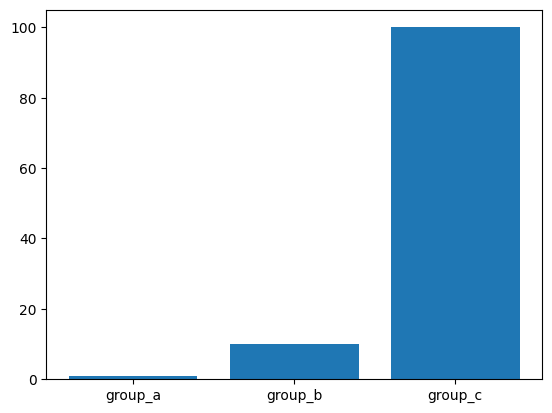

date
2020-01-22            0.0
2020-01-23            0.0
2020-01-24            0.0
2020-01-25            0.0
2020-01-26            0.0
                 ...     
2021-05-25    842131005.0
2021-05-26    882423257.0
2021-05-27    886199984.0
2021-05-28    893388665.0
2021-05-29    908770495.0
Name: daily_vaccinations, Length: 494, dtype: float64


<AxesSubplot: >

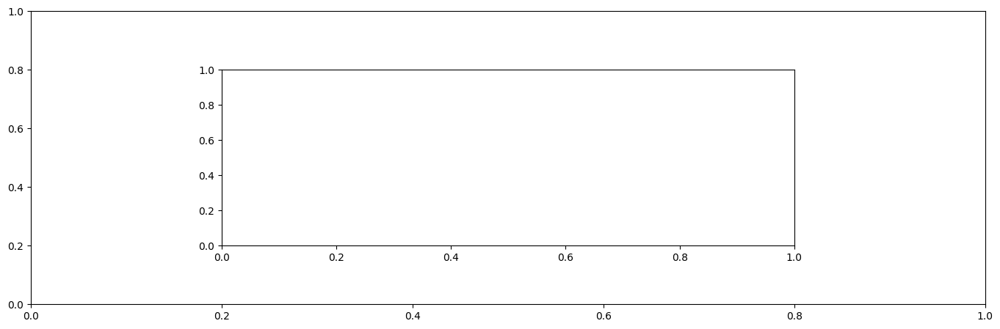

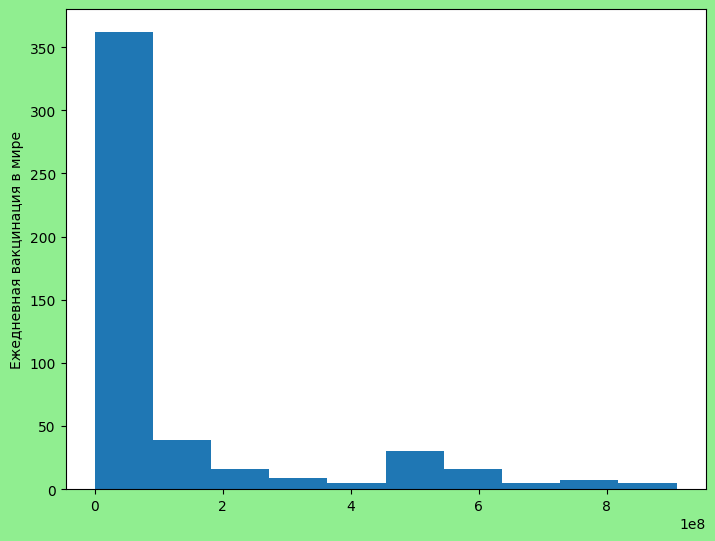

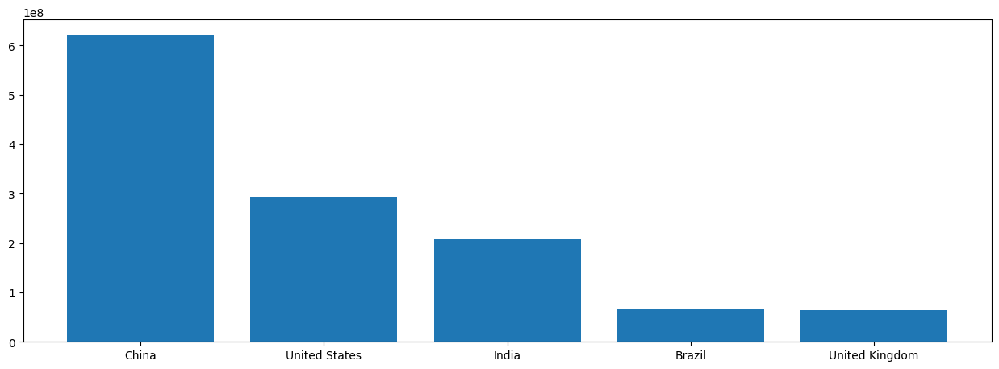

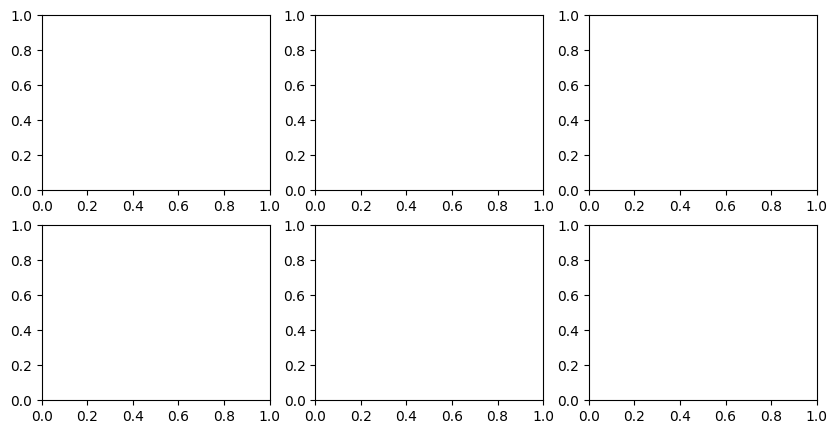

In [ ]:
#Модульный подход основан на обращении к модулю pyplot (plt) напрямую, а не средствами объектов фигур и
# плоскостей. Например, следующий код строит столбчатую диаграмму: по оси x откладываются элементы списка names
# (названия групп), а высоту столбцов определяет список values.
names = ['group_a', 'group_b', 'group_c']
values = [1, 10, 100]
plt.bar(names, values)
plt.show()

fig = plt.figure(figsize=(13, 4))
main_axes = fig.add_axes([0, 0, 1, 1])
insert_axes = fig.add_axes([0.2, 0.2, 0.6, 0.6])

fig = plt.figure(facecolor='lightgreen')
axes = fig.add_axes([0, 0, 1, 1])
axes.hist(covid_df.groupby('date')['daily_vaccinations'].sum())
axes.set_ylabel('Ежедневная вакцинация в мире');
x = covid_df['date']
print (covid_df.groupby('date')['daily_vaccinations'].sum())

v = covid_df.groupby(['country'])['total_vaccinations'].last().nlargest(5)
fig = plt.figure(figsize=(12, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.bar(x=v.index,height=v)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10,5))
axes[1, 2]


0.12.1


,date,province/state,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,...,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate,population,daily_confirmed_per_hundred,quarter,confirmed per hundred
0,2020-01-23,NaN,Australia,0.0,0.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,25726900,NaN,1,0.000000
1,2020-01-25,NaN,Australia,4.0,0.0,0.0,4.0,4.0,0.0,0.0,...,NaN,NaN,NaN,NaN,0.000000,0.00000,25726900,0.000016,1,0.000016
2,2020-01-26,NaN,Australia,4.0,0.0,0.0,4.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,0.000000,0.00000,25726900,0.000000,1,0.000016
3,2020-01-27,New South Wales,Australia,4.0,0.0,0.0,4.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,0.000000,0.00000,25726900,0.000000,1,0.000016
4,2020-01-27,Victoria,Australia,1.0,0.0,0.0,1.0,-3.0,0.0,0.0,...,NaN,NaN,NaN,NaN,0.000000,0.00000,25726900,-0.000012,1,0.000004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54252,2021-05-29,"Saint Helena, Ascension and Tristan da Cunha",United Kingdom,4.0,0.0,4.0,0.0,-122571.0,-2153.0,4.0,...,25332851.0,37.14,572132.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",0.000000,100.00000,67802690,-0.180776,2,0.000006
54253,2021-05-29,Scotland,United Kingdom,234895.0,7668.0,0.0,227227.0,234891.0,7668.0,-4.0,...,25332851.0,37.14,572132.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",3.264437,0.00000,67802690,0.346433,2,0.346439
54254,2021-05-29,Turks and Caicos Islands,United Kingdom,2412.0,17.0,2381.0,14.0,-232483.0,-7651.0,2381.0,...,25332851.0,37.14,572132.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",0.704809,98.71476,67802690,-0.342882,2,0.003557
54255,2021-05-29,Unknown,United Kingdom,0.0,0.0,0.0,0.0,-2412.0,-17.0,-2381.0,...,25332851.0,37.14,572132.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",NaN,NaN,67802690,-0.003557,2,0.000000


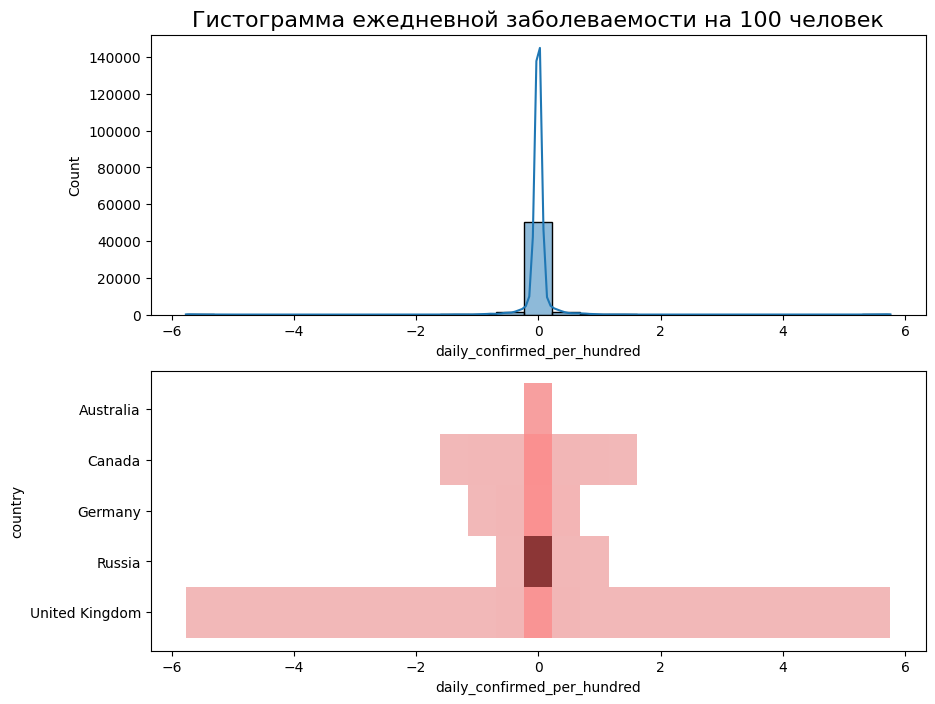

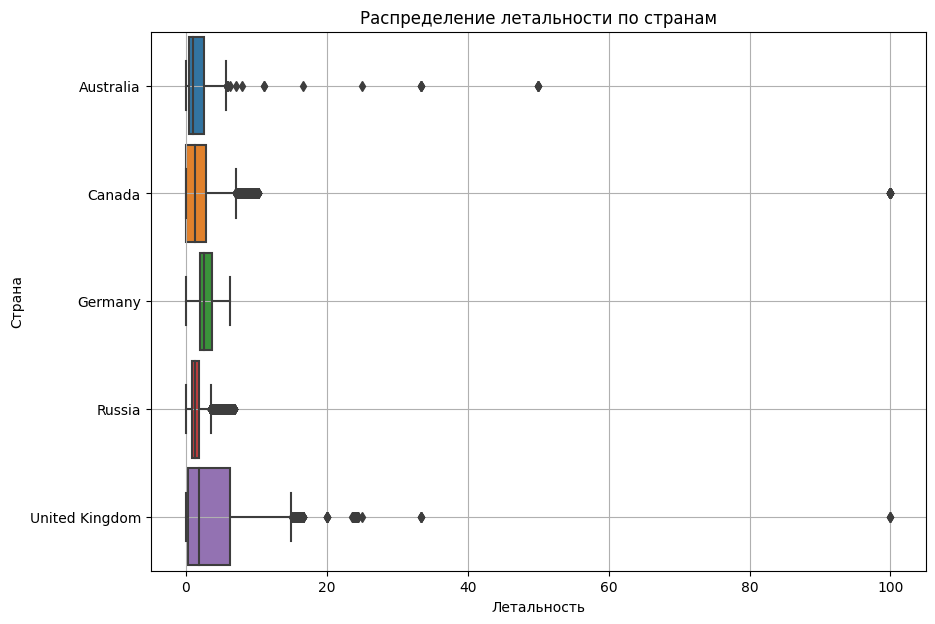

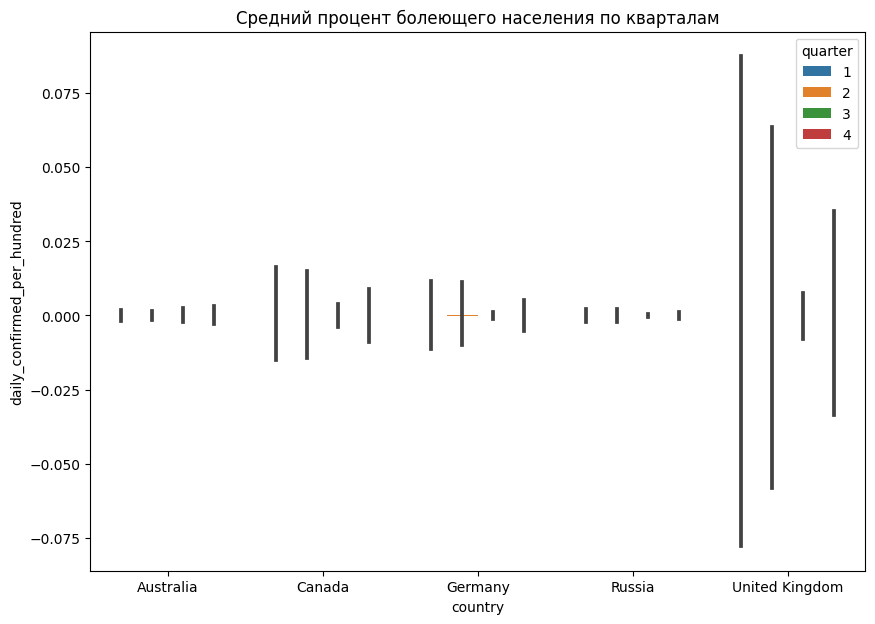

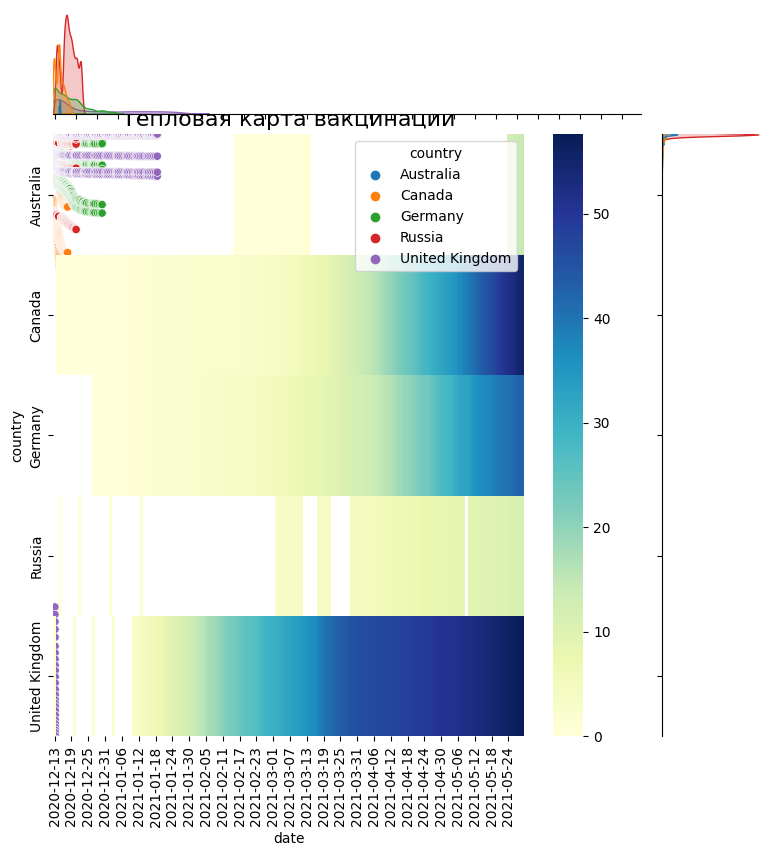

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
print(sns.__version__)
#Для фильтрации по списку значений используем метод isin(), который проверяет, есть ли запись в столбце в
#переданном в метод списке. В результате возвращается привычная нам маска.
"""⭐ А теперь снова немного магии Feature Engineering, чтобы показатели по странам стали сопоставимыми: добавим
информацию о населении стран, чтобы рассчитать ежедневную заболеваемость на 100 человек — заболеваемость
в процентах от общего количества населения (daily_confirmed_per_hundred)."""
countries = ['Russia', 'Australia', 'Germany', 'Canada', 'United Kingdom']
croped_covid_df = covid_df[covid_df['country'].isin(countries)]

populations = pd.DataFrame([
    ['Canada', 37664517],
    ['Germany', 83721496],
    ['Russia', 145975300],
    ['Australia', 25726900],
    ['United Kingdom', 67802690]],
    columns=['country', 'population']
)
croped_covid_df = croped_covid_df.merge(populations, on=['country'])
croped_covid_df['daily_confirmed_per_hundred'] = croped_covid_df['daily_confirmed'] / croped_covid_df['population'] * 100
croped_covid_df.head()
'''Основные параметры метода histplot()
data — DataFrame, по которому строится график;
x — признак, который будет отложен по оси абсцисс;
y — признак, который будет отложен по оси ординат;
hue — группировочный категориальный признак, который позволяет строить отдельный график для каждой категории
(не стоит использовать его для гистограмм, но он широко используется для других видов графиков в Seaborn);
ax — система координат Matplotlib, в которой строится график;
color — цвет графика;
bins — число столбцов в гистограмме (по умолчанию вычисляется автоматически с помощью специальных формул);
kde — параметр, указывающий, стоит ли сглаживать гистограмму кривой (по умолчанию False).
Построим сразу две гистограммы: одна будет иллюстрировать общее распределение ежедневной заболеваемости
(daily_confirmed), а вторая — то же распределение в разрезе стран. 
Для этого создаём две координатные плоскости с помощью метода subplots(). 
На первой координатной плоскости рисуем простую гистограмму с 25 столбцами,
а также добавим на неё сглаживающую кривую. 
На второй гистограмме добавляем параметр названия страны по оси y. В таком случае количество наблюдений будет
обозначаться на диаграмме яркостью цвета (чем темнее полоса, тем больше наблюдений находится в интервале).'''
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))
sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    bins=25,
    kde=True,
    ax=axes[0]
);
axes[0].set_title('Гистограмма ежедневной заболеваемости на 100 человек', fontsize=16)
sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    y='country',
    bins=25,
    color='red',
    ax=axes[1]
);
#Ящики отразим горизонтально (для этого по оси x отложим признак летальности, а по оси y — страны),
#параметр orient отвечает за ориентацию диаграммы, а width — за ширину коробок:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='death_rate',
    orient='h',
    width=0.9
)
boxplot.set_title('Распределение летальности по странам');
boxplot.set_xlabel('Летальность');
boxplot.set_ylabel('Страна');
boxplot.grid()

'''Для построения столбчатых диаграмм в Seaborn используется метод barplot(). По умолчанию метод отображает
среднее по столбцу, который указан в параметре x (вместо среднего можно вычислить и любую другую статистическую
характеристику, наименование которой задаётся в параметре estimator). Для добавления многоуровневости
используется параметр hue, который позволяет группировать данные по признаку:'''
fig = plt.figure(figsize=(10, 7))
croped_covid_df['quarter'] = croped_covid_df['date'].dt.quarter
barplot = sns.barplot(
    data=croped_covid_df,
    x='country',
    y='daily_confirmed_per_hundred',
    hue='quarter',
)
barplot.set_title('Средний процент болеющего населения по кварталам');
'''Построим один из самых любимых дата-сайентистами графиков — jointplot() — в котором совмещены диаграмма
рассеяния и гистограмма. Это довольно удобный и полезный инструмент, когда мы хотим одновременно посмотреть
и на распределения переменных, и сразу оценить их взаимосвязь.
Построим jointplot зависимости ежедневной заболеваемости в странах от общей численности населения в процентах
(daily_confirmed_per_hundred) от числа полностью вакцинированных в процентах (people_fully_vaccinated_per_hundred).
Параметры xlim и ylim определяют диапазон отображения осей x и y. Параметр height отвечает за высоту и
ширину графика (он квадратный).'''
jointplot = sns.jointplot(
    data=croped_covid_df, 
    x='people_fully_vaccinated_per_hundred', 
    y='daily_confirmed_per_hundred',
    hue='country',
    xlim = (0, 40),
    ylim = (0, 0.1),
    height=8,
)
'''Допустим, мы хотим сравнить темпы вакцинации по странам во времени. Вы, скорее всего, сразу подумали о
линейном графике. Но давайте мыслить шире. Когда мы хотим сравнить скорость изменения показателей по малому
количеству категорий (в данном случае — по странам, а их у нас их всего пять), нагляднее всего будет тепловая
карта.
Предварительно создадим сводную таблицу: по столбцам отложим признак даты, а по строкам — страны. В ячейках
таблицы будет находиться процент вакцинированных (первым компонентом) людей в стране на определённую дату.
Чтобы даты отображались на тепловой карте верно, их необходимо привести к типу string.'''
pivot = croped_covid_df.pivot_table(
    values='people_vaccinated_per_hundred',
    columns='date',
    index='country',
)
pivot.columns = pivot.columns.astype('string')
pivot
'''Для построения тепловой карты в Seaborn используется метод heatmap(). Данный метод работает с табличными
данными и визуализирует все ячейки таблицы с помощью цвета. Параметр annot отвечает за отображение легенды
(аннотации), параметр cmap — за цветовую гамму графика.'''
heatmap = sns.heatmap(data=pivot, cmap='YlGnBu')
heatmap.set_title('Тепловая карта вакцинации', fontsize=16);

croped_covid_df['confirmed per hundred'] = (croped_covid_df['confirmed']
                                            /croped_covid_df['population'] * 100)
croped_covid_df

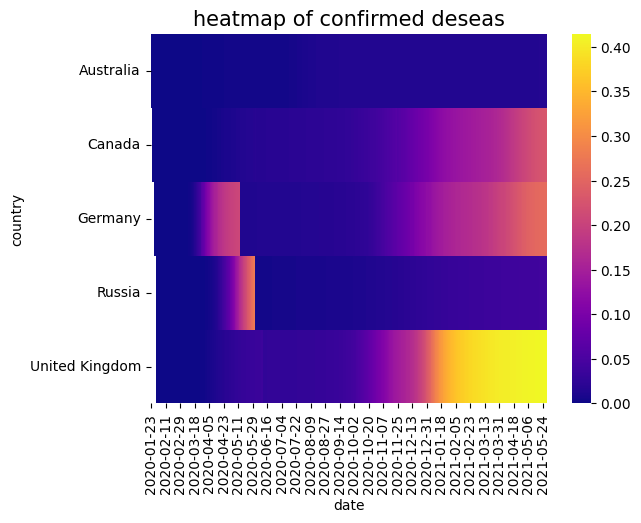

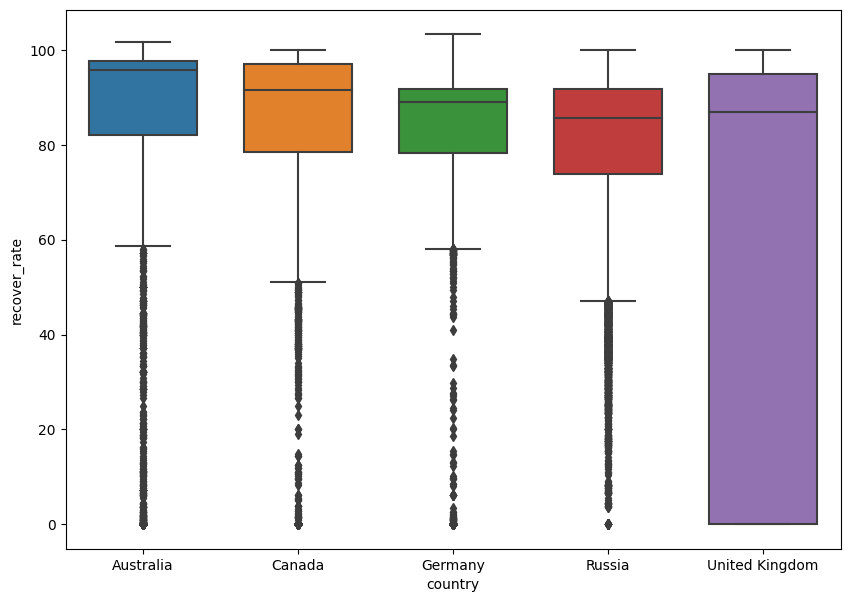

In [ ]:
#Какой график строит код ниже?
sns.barplot(
    data=croped_covid_df,
    x='country',
    y='people_fully_vaccinated_per_hundred',
    estimator=max
)
#Столбчатую диаграмму, отображающую процентное отношение вакцинированных людей к общей численности населения страны 

#Создайте новый признак confirmed_per_hundred, который покажет процентное отношение заболевших вирусом к общему
#числу населения в странах (confirmed / population * 100).
#Постройте тепловую карту, которая покажет, как росло число заболевших в процентах от общего числа населения
#(confirmed_per_hundred) в странах из таблицы croped_covid_df.
croped_covid_df['confirmed_per_hundred'] = (croped_covid_df['confirmed']
                                            /croped_covid_df['population'] * 100)
pivot_croped = croped_covid_df.pivot_table(
    values='confirmed_per_hundred',
    index='country',
    columns='date'
)
pivot_croped.columns = pivot_croped.columns.astype('string')
heatmap=sns.heatmap(data=pivot_croped, cmap='plasma')
heatmap.set_title('heatmap of confirmed deseas', fontsize=15)

#Постройте коробчатую диаграмму для признака recover_rate (отношение выздоровлений к числу зафиксированных случаев
#заболевания в процентах). Выберите верные выводы по данному графику:
fig=plt.figure(figsize=(10,7))
boxplot = sns.boxplot(
    data=croped_covid_df,
    y='recover_rate',
    x='country',
    orient='v',
    width=0.7
)


In [2]:
import plotly
import plotly.express as px
print(plotly.__version__)
"""С помощью экспресс-режима (px) можно строить уже знакомые нам графики:
line() — линейные графики;
histogram() — гистограммы;
scatter() — диаграммы рассеяния;
box() — коробчатые диаграммы;
bar() — столбчатые диаграммы;
pie() — круговые диаграммы.
Также есть множество других графиков — их список вы можете посмотреть в документации.

Основные параметры метода line()
data_frame — DataFrame, по которому строится график;
x — признак по оси абсцисс;
y — признак по оси ординат;
height — высота графика;
width — ширина графика;
title — название графика."""

#Построим график роста зафиксированного числа случаев заражения (confirmed), смертей (deaths), выздоровлений
#(recovered) и активных случаев (active) за всё время. Для этого просуммируем статистику по дням и передадим
#полученный DataFrame в метод line().Для отображения созданной методом line() фигуры используется метод fig.show():
line_data = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_data, #DataFrame
    x='date', #ось абсцисс
    y=['confirmed', 'recovered', 'deaths', 'active'], #ось ординат \\ try to add this list to groupby above
    height=500, #высота
    width=1000, #ширина
    title='Confirmed, Recovered, Deaths, Active cases over Time' #заголовок
)
fig.show()

"""Давайте рассмотрим ещё один пример — построим столбчатую диаграмму, показывающую ТОП-10 стран по среднему
проценту выздоравливающих пациентов (recover_rate). Для этого используем метод bar() модуля express. Добавим
несколько параметров:
color — группирующий признак, в соответствии с которым будут раскрашены столбцы диаграммы;
text — текст, который будет подписан на столбцах диаграммы;
orientation — ориентация графика ('v' — вертикальная, 'h' — горизонтальная)."""

#считаем средний процент выздоровлений для каждой страны
bar_data = covid_df.groupby(
    by='country',
    as_index=False
)[['recover_rate']].mean().round(2).nlargest(10, columns=['recover_rate'])

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="country", #ось x
    y="recover_rate", #ось y
    color='country', #расцветка в зависимости от страны
    text = 'recover_rate', #текст на столбцах
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    title='Top 10 Countries for Recovery Rate' #заголовок
)
#отображаем его
fig.show()

"""Основные параметры метода treemap()

data_frame — DataFrame, по которому строится график;
path — категориальные признаки (их может быть несколько), в разрезе которых строится диаграмма;
values — показатель, по которому рассчитываются размеры прямоугольников."""

#считаем среднее ежедневно фиксируемое количество выздоровевших по странам
treemap_data = covid_df.groupby(
    by='country',
    as_index=False
)[['daily_recovered']].mean()

#строим график
fig = px.treemap(
    data_frame=treemap_data, #DataFrame
    path=['country'], #категориальный признак, для которого строится график
    values='daily_recovered', #параметр, который сравнивается
    height=500, #высота
    width=1000, #ширина
    title='Daily Recovered Cases by Country' #заголовок
)
#отображаем график
fig.show()

"""Основные параметры метода choropleth()
data_frame — DataFrame, по которому строится график;
locations — название столбца, из которого берутся локации (столбец со странами или регионами);
locationmode — режим геопривязки; определяет, как будет производиться сопоставление данных с картой в Plotly
(возможно сопоставление по названию страны, "country_name", или по её трёхзначному шифру, согласно международному
стандарту ISO-3);
range_color — диапазон изменения цвета;
animation_frame — анимирующий признак, изменяя который, мы получаем визуализацию во времени;
color_continuous_scale — цветовая палитра."""
#преобразуем даты в строковый формат
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')

#строим график
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="confirmed", #от чего зависит цвет
    animation_frame="date", #анимационный бегунок
    range_color=[0, 30e6], #диапазон цвета
    title='Global Spread of COVID-19', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем график
fig.show()

"""Для построения 3D диаграммы используем метод scatter_3d(). Добавим несколько параметров:
z — параметр по оси аппликат;
log_x — установка логарифмического масштаба по оси x;
log_y — установка логарифмического масштаба по оси y.
Чтобы не перегрузить график, будем строить зависимость только в нескольких странах: США, России, Великобритании,
Бразилии и Франции. Наблюдения для каждой страны окрасим разными цветами."""
#фильтруем таблицу по странам
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
scatter_data = covid_df[covid_df['country'].isin(countries)]

#строим график
fig = px.scatter_3d(
    data_frame=scatter_data, #DataFrame
    x = 'daily_confirmed', #ось абсцисс
    y = 'daily_deaths', #ось ординат
    z = 'daily_vaccinations', #ось аппликат
    color='country', #расцветка в зависимости от страны
    log_x=True, 
    log_y=True,
    width=1000,
    height=700
)

#отображаем график
fig.show()
#fig.write_html("plotly/scatter_3d.html")#Сохраним график трёхмерной диаграммы рассеяния:
#В результате в папке plotly (которую необходимо создать заранее) у вас появится файл с графиком.
"""Чтобы сохранить интерактивный график, построенный в библиотеке Plotly, чаще всего используется метод фигуры
fig.write_html('path/to/file.html'), который сохраняет график в формате HTML, после чего вы можете вставлять его
на свой сайт, в веб-приложение или просто делиться им с коллегами. """

#С помощью какого варианта кода можно построить график, представленный ниже?
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
box_data = covid_df[covid_df['country'].isin(countries)]
fig = px.box(data_frame=box_data, x = 'daily_vaccinations_per_million', color='country')
fig.show()

#Постройте линейный график, который отображает, как изменялось ежедневное количество вакцинированных
#(daily_vaccinations) в мире во времени. Из графика найдите, чему равно количество вакцинированных (в миллионах)
#28 февраля 2021 года (2021-02-28). Ответ округлите до целого числа.
vaccin_group = covid_df.groupby('date')['daily_vaccinations'].sum()
vaccin_group.loc['2021-02-28']
line_daily_vaccinations = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_daily_vaccinations,
    x='date',
    y=['daily_vaccinations'],
    height=500,
    width=800
)
figshow()

5.11.0


C:\Users\управ.ПК\AppData\Local\Temp\ipykernel_14312\4168565695.py:24: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  line_data = covid_df.groupby('date', as_index=False).sum()


FileNotFoundError: [Errno 2] No such file or directory: 'plotly\\scatter_3d.html'

175922493.0